## Fruit Classification Project

In [39]:
import numpy as np 
import cv2
import glob
import os
import matplotlib.pyplot as plt
import string
from mlxtend.plotting import plot_decision_regions
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.utils.multiclass import unique_labels
from sklearn import metrics
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from skimage.feature import hog
from skimage import exposure
from sklearn.model_selection import learning_curve

In [2]:
print(os.listdir("../"))

dim = 100

['.git', '.ipynb_checkpoints', 'fruits-360', 'Project']


In [3]:
def getYourFruits(fruits, data_type, print_n=False, k_fold=False):
    images = []
    labels = []
    val = ['Training', 'Test']
    if not k_fold:
        path = "../fruits-360/" + data_type + "/"
        for i,f in enumerate(fruits):
            p = path + f
            j=0
            for image_path in glob.glob(os.path.join(p, "*.jpg")):
                image = cv2.imread(image_path, cv2.IMREAD_COLOR)
                image = cv2.resize(image, (dim, dim))
                image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
                images.append(image)
                labels.append(i)
                j+=1
            if(print_n):
                print("There are " , j , " " , data_type.upper(), " images of " , fruits[i].upper())
        images = np.array(images)
        labels = np.array(labels)
        return images, labels
    else:
        for v in val:
            path = "../fruits-360/" + v + "/"
            for i,f in enumerate(fruits):
                p = path + f
                j=0
                for image_path in glob.glob(os.path.join(p, "*.jpg")):
                    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
                    image = cv2.resize(image, (dim, dim))
                    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
                    images.append(image)
                    labels.append(i)
                    j+=1
        images = np.array(images)
        labels = np.array(labels)
        return images, labels

def getAllFruits():
    fruits = []
    for fruit_path in glob.glob("../fruits-360/Training/*"):
        fruit = fruit_path.split("/")[-1]
        fruits.append(fruit)
    return fruits

In [4]:
#Choose your Fruits
fruits = ['Pineapple' , 'Cocos', 'Avocado', 'Apple', 'Orange' ] # Multi fruit classification

#Get Images and Labels 
X_t, y_train =  getYourFruits(fruits, 'Training', print_n=True, k_fold=False)
X_test, y_test = getYourFruits(fruits, 'Test', print_n=True, k_fold=False)

#Get data for k-fold
X,y = getYourFruits(fruits, '', print_n=True, k_fold=True)

#Scale Data Images
scaler = StandardScaler()
X_train = scaler.fit_transform([i.flatten() for i in X_t])
X_test = scaler.fit_transform([i.flatten() for i in X_test])
X = scaler.fit_transform([i.flatten() for i in X])

There are  490   TRAINING  images of  PINEAPPLE
There are  490   TRAINING  images of  COCOS
There are  427   TRAINING  images of  AVOCADO
There are  1413   TRAINING  images of  APPLE
There are  479   TRAINING  images of  ORANGE
There are  166   TEST  images of  PINEAPPLE
There are  166   TEST  images of  COCOS
There are  143   TEST  images of  AVOCADO
There are  472   TEST  images of  APPLE
There are  160   TEST  images of  ORANGE


In [5]:
def plot_image_grid(images, nb_rows, nb_cols, figsize=(15, 15)):
    assert len(images) == nb_rows*nb_cols, "Number of images should be the same as (nb_rows*nb_cols)"
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=figsize)
    
    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].axis('off')
            axs[i, j].imshow(images[n])
            n += 1        

Pineapple



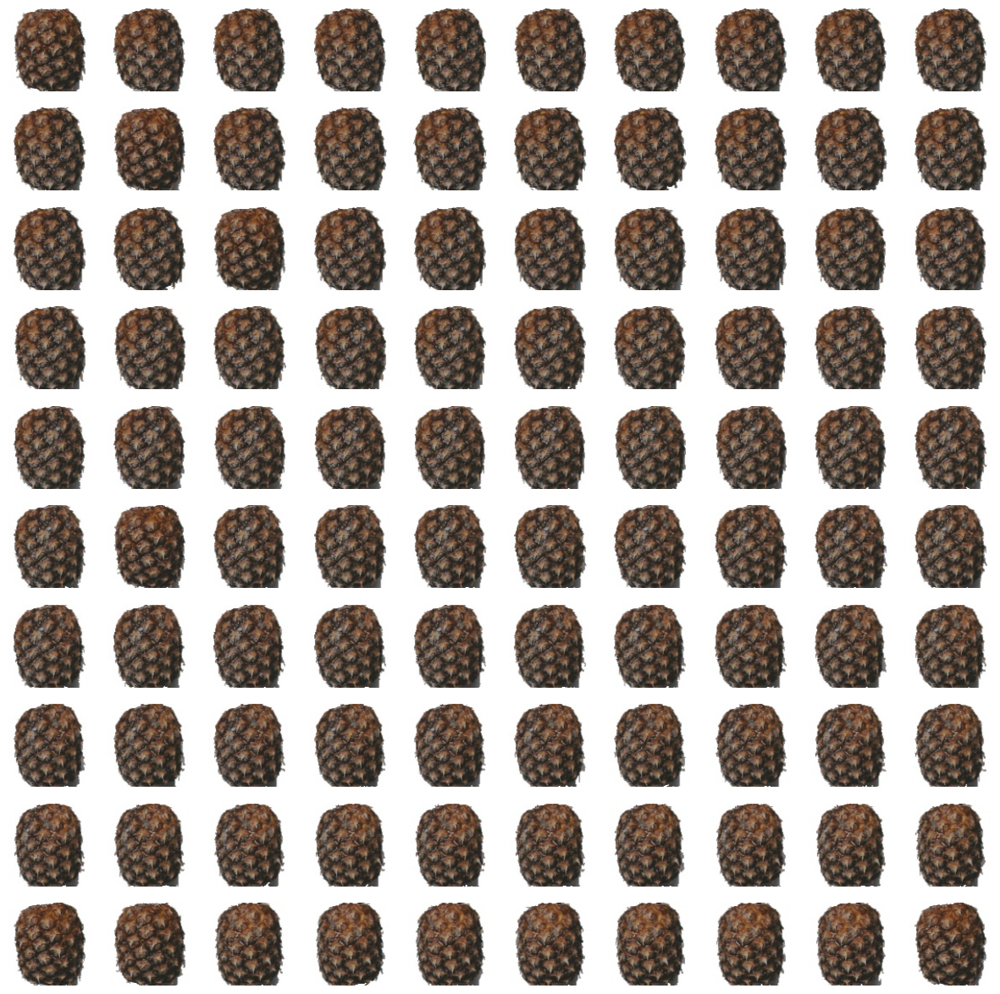

In [6]:
# This displays part of the data for Pineapples
print(fruits[y_train[0]] + "\n")
plot_image_grid(X_t[0:100], 10, 10)

Cocos



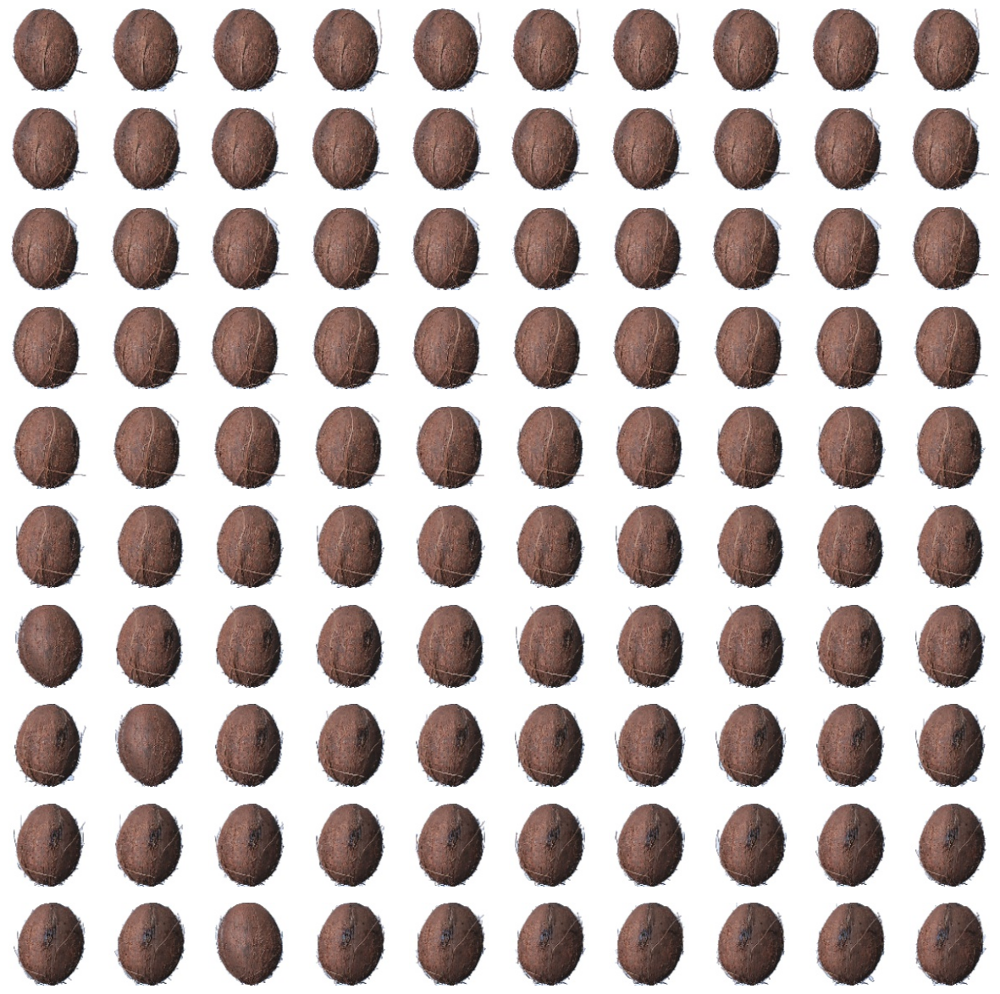

In [7]:
# This displays part of the data for Coconuts
print(fruits[y_train[490]] + "\n")
plot_image_grid(X_t[490:590], 10, 10)

Avocado



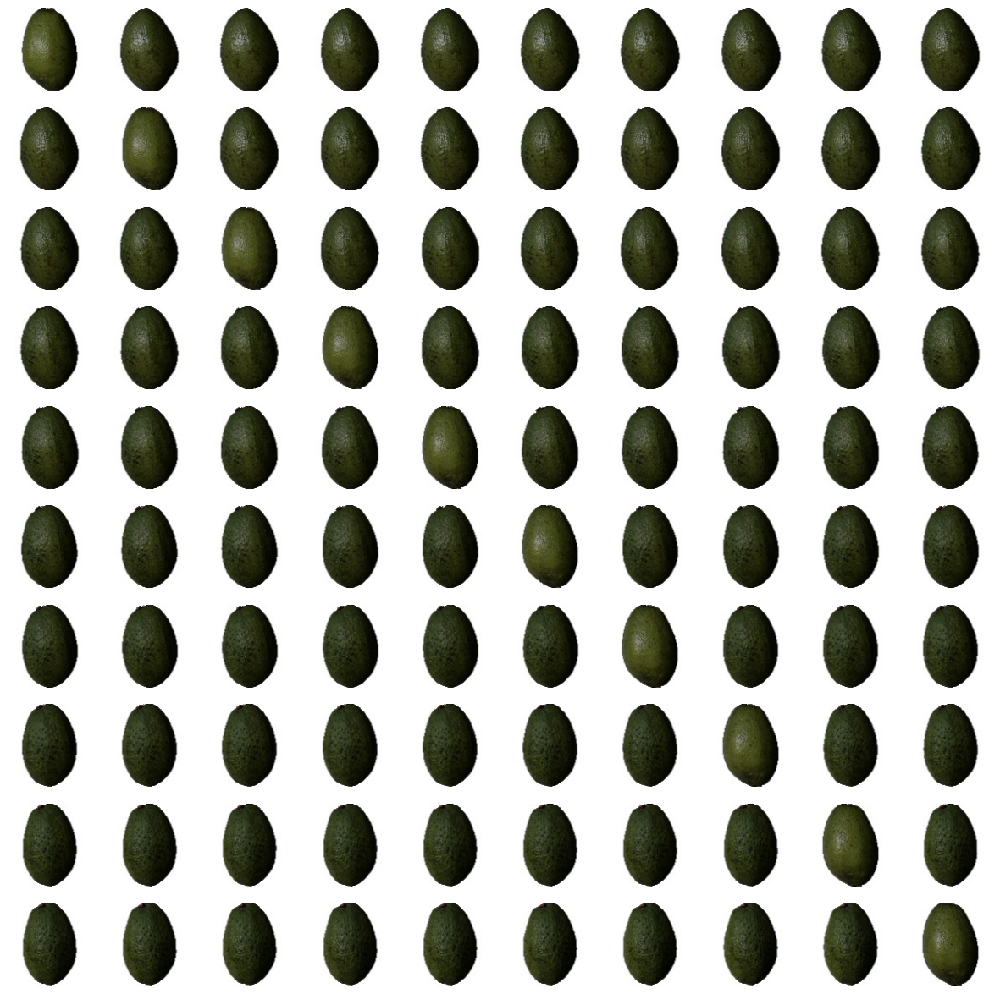

In [8]:
# This displays part of the data for Avocados
print(fruits[y_train[980]] + "\n")
plot_image_grid(X_t[980:1080], 10, 10)

Apple



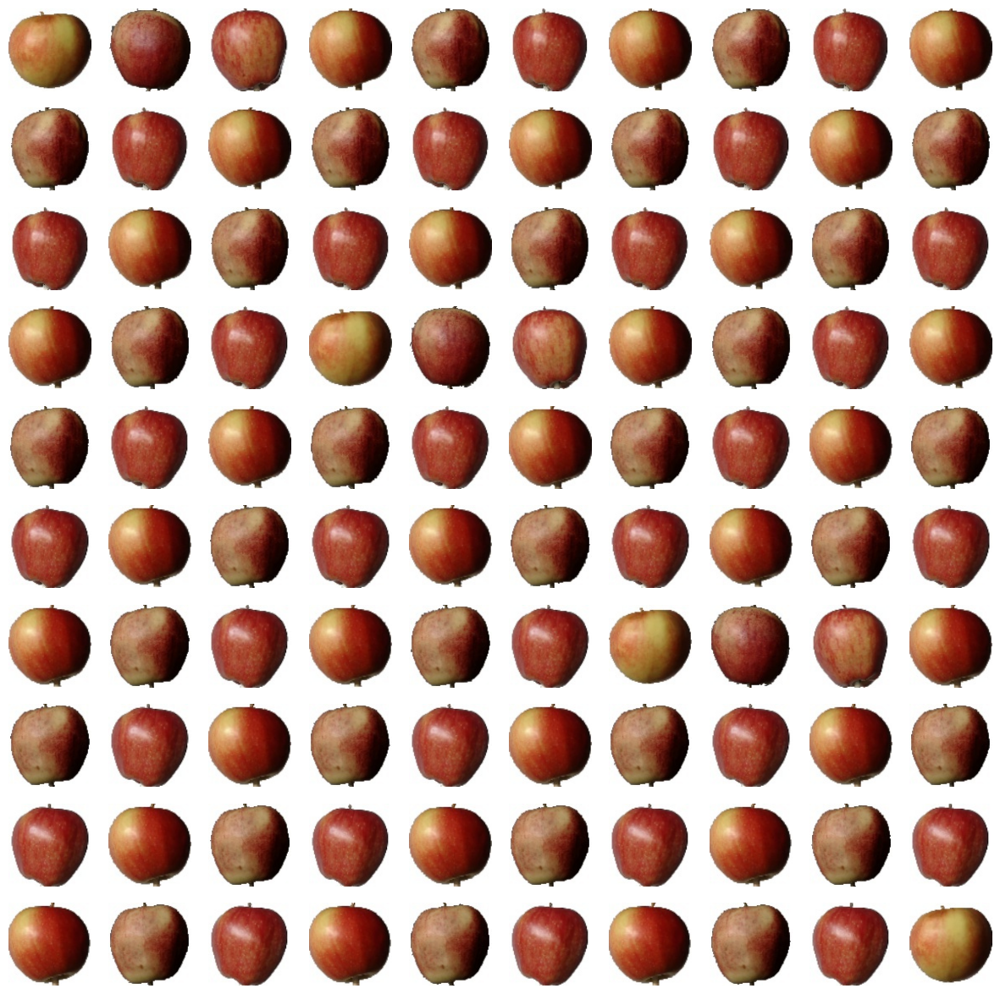

In [9]:
# This displays part of the data for Apples
print(fruits[y_train[1407]] + "\n")
plot_image_grid(X_t[1407:1507], 10, 10)

Orange



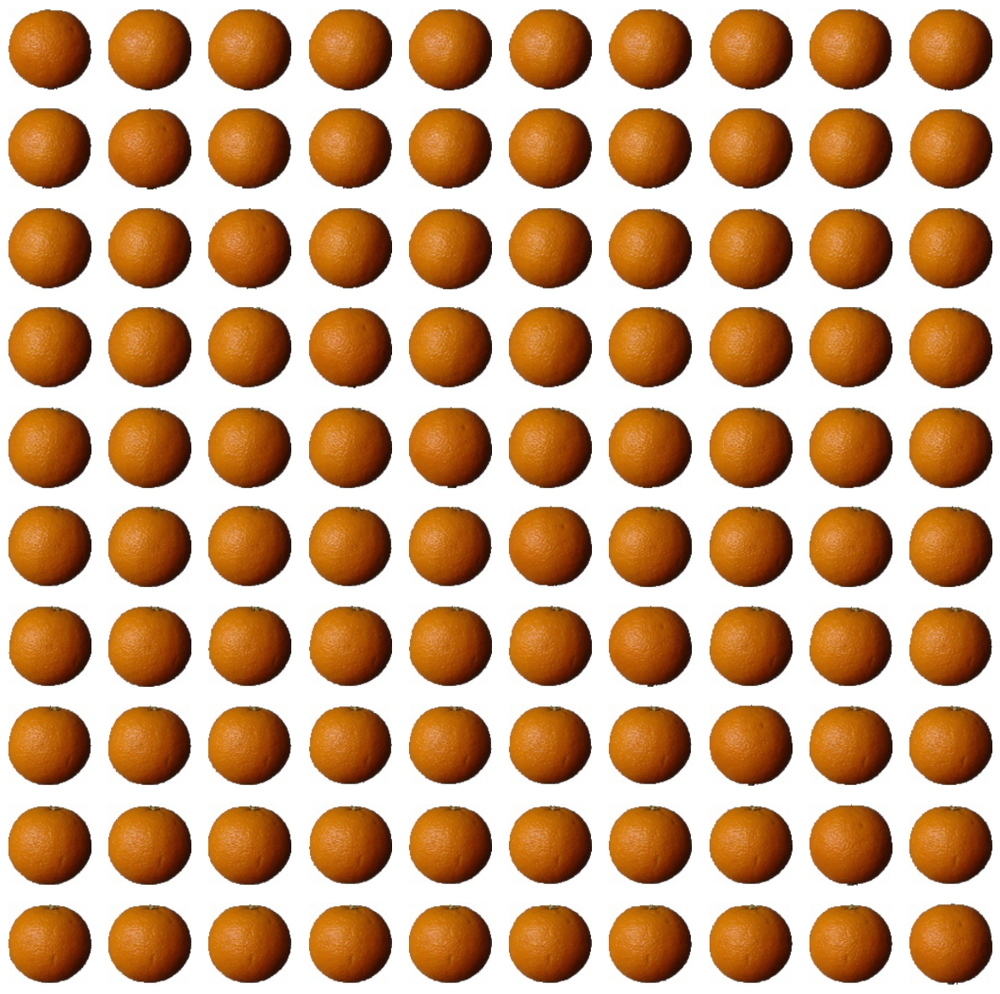

In [10]:
# This displays part of the data for Oranges
print(fruits[y_train[2820]] + "\n")
plot_image_grid(X_t[2820:2920], 10, 10)

In [11]:
def getClassNumber(y):
    v =[]
    i=0
    count = 0
    for index in y:
        if(index == i):
            count +=1
        else:
            v.append(count)
            count = 1
            i +=1
    v.append(count)        
    return v

def plotPrincipalComponents(X, dim):
    v = getClassNumber(y_train)
    colors = 'b', 'g', 'r', 'c', 'm', 'y', 'k', 'grey', 'orange', 'purple'
    markers = ['o', 'x' , 'v', 'd']
    tot = len(X)
    start = 0 
    if(dim == 2):
        for i,index in enumerate(v):
            end = start + index
            plt.scatter(X[start:end,0],X[start:end,1] , color=colors[i%len(colors)], marker=markers[i%len(markers)], label = fruits[i])
            start = end
        plt.xlabel('PC1')
        plt.ylabel('PC2')
    
    if(dim == 3):
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        for i,index in enumerate(v):
            end = start + index
            ax.scatter(X[start:end,0], X[start:end,1], X[start:end,2], color=colors[i%len(colors)], marker=markers[i%len(markers)], label = fruits[i])
            start = end
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.set_zlabel('PC3')


    plt.legend(loc='lower left')
    plt.xticks()
    plt.yticks()
    plt.show()

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = metrics.confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = unique_labels(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=fruits, yticklabels=fruits,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return cm,ax

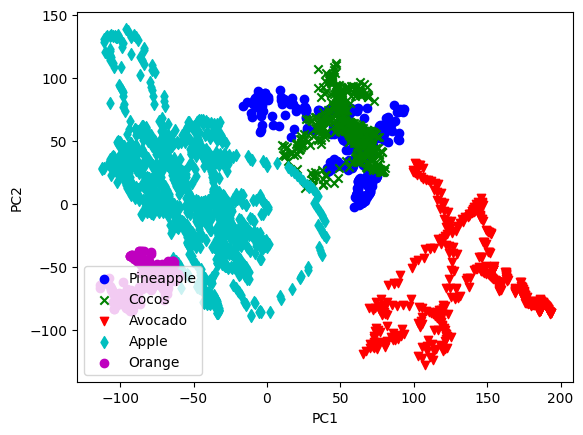

In [12]:
pca = PCA(n_components=2)
dataIn2D = pca.fit_transform(X_train)
plotPrincipalComponents(dataIn2D, 2)

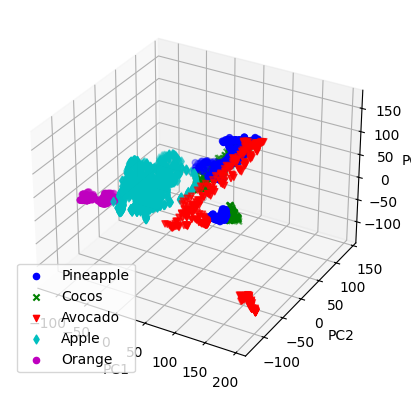

In [13]:
pca = PCA(n_components=3)
dataIn3D = pca.fit_transform(X_train)
plotPrincipalComponents(dataIn3D, 3)

In [14]:
def showPCA(image,X2, X10, X50):
    fig = plt.figure(figsize=(15,15))
    ax1 = fig.add_subplot(1,4,1)
    ax1.axis('off')
    ax1.set_title('Original image')
    plt.imshow(image)
    ax1 = fig.add_subplot(1,4,2)
    ax1.axis('off') 
    ax1.set_title('50 PC')
    plt.imshow(X50)
    ax1 = fig.add_subplot(1,4,3)
    ax1.axis('off') 
    ax1.set_title('10 PC')
    plt.imshow(X10)
    ax2 = fig.add_subplot(1,4,4)
    ax2.axis('off') 
    ax2.set_title('2 PC')
    plt.imshow(X2)
    plt.show()

def computePCA(n, im_scaled, image_id):
    pca = PCA(n)
    principalComponents = pca.fit_transform(im_scaled)
    im_reduced = pca.inverse_transform(principalComponents)
    newImage = scaler.inverse_transform(im_reduced[image_id].reshape(1, -1))
    return newImage

def showVariance(X_train):
    #Compute manually the principal components
    cov_matr=np.dot(X_train, X_train.T)
    eigval,eigvect=np.linalg.eig(cov_matr)

    index=np.argsort(eigval)[::-1] #take in order the index of ordered vector (ascending order)

    #eigvect[:,i] is associated to eigval[i] so 
    eigvect=eigvect[:,index]
    eigval=eigval[index]

    n_PC=[]
    var_explained=[]
    var_temp=[]
    var_tmp=0
    for i in range(10):
        var_tmp=var_tmp+eigval[i]
        n_PC.append(i)
        var_temp.append(eigval[i]/(eigval.sum())*100)
        var_explained.append(var_tmp/(eigval.sum())*100)

    fig, ax = plt.subplots(figsize=(8,8))

    ind = np.arange(10)    
    width = 0.35         # the width of the bars
    p1 = ax.bar(ind, var_temp, width, color='b')
    p2 = ax.bar(ind + width, var_explained, width, color='r')

    ax.legend((p1[0], p2[0]), ('Individual explained variance', 'Cumulative explained variance'))

    ax.set_title('Variance explained using PCs')
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(('1', '2', '3', '4', '5', '6', '7', '8', '9', '10'))

    plt.xlabel('Number of PC')
    plt.ylabel('Variance exaplained in %')

    ax.autoscale_view()

    plt.show()

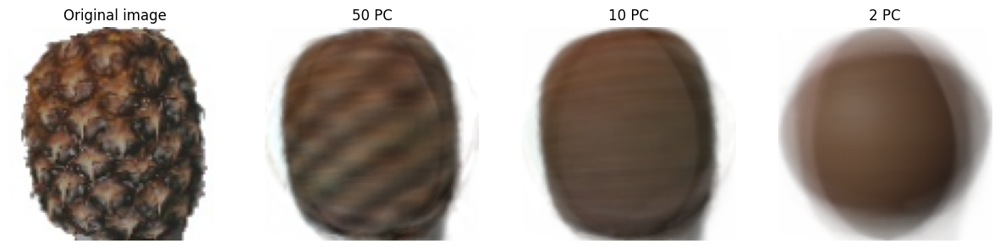

In [15]:
image_id = 2
image = X_t[image_id]

#Compute PCA
X_2 = computePCA(2, X_train,image_id)
X_10 = computePCA(10, X_train,image_id)
X_50 = computePCA(50, X_train,image_id)

#Reshape in order to plot images
X2 = np.reshape(X_2, (dim,dim,3)).astype(int)
X10 = np.reshape(X_10, (dim,dim,3)).astype(int)
X50 = np.reshape(X_50, (dim,dim,3)).astype(int)

X2 = np.clip(X2, 0, 255)
X10 = np.clip(X10, 0, 255)
X50 = np.clip(X50, 0, 255)

#Plot
showPCA(image, X2, X10, X50)

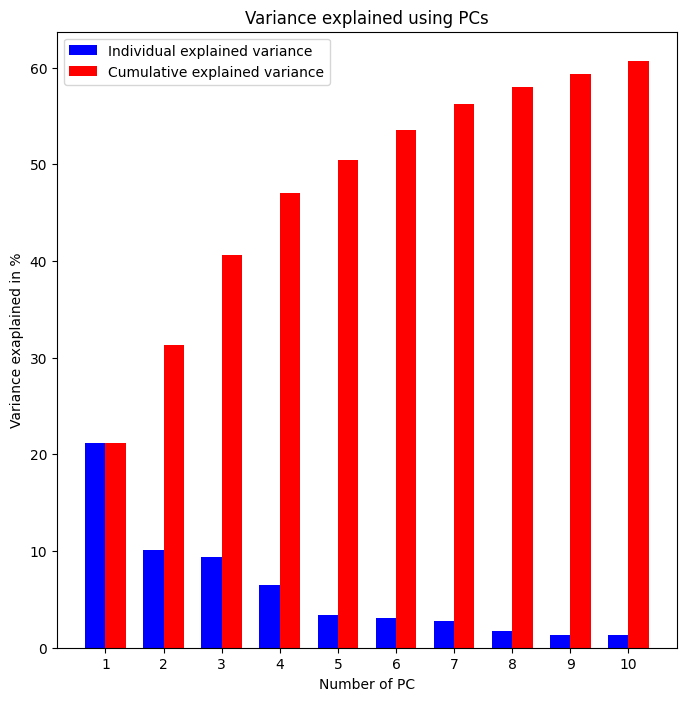

In [16]:
showVariance(X_train)

## Binary Classification

### Linear SVM

Accuracy with SVM: 99.28%


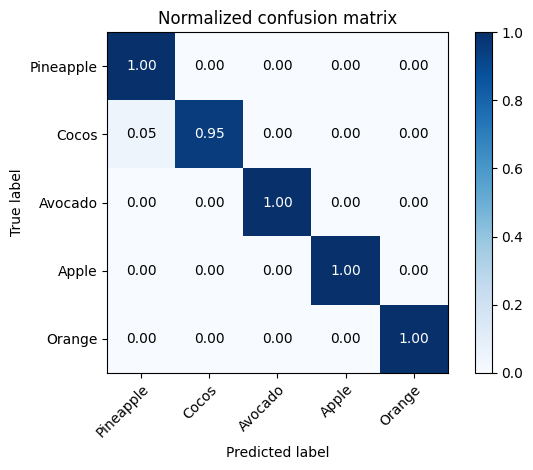

In [17]:
svm = SVC(gamma='auto', kernel='linear', probability=True)
svm.fit(X_train, y_train) 
y_pred = svm.predict(X_test)

#Evaluation
precision = metrics.accuracy_score(y_pred, y_test) * 100
print("Accuracy with SVM: {0:.2f}%".format(precision))
cm , _ = plot_confusion_matrix(y_test, y_pred,classes=y_train, normalize=True, title='Normalized confusion matrix')
plt.show()

### Random Forest

Accuracy with Random Forest: 99.64%

Classification Report:
               precision    recall  f1-score   support

   Pineapple       1.00      0.99      0.99       166
       Cocos       0.98      1.00      0.99       166
     Avocado       1.00      1.00      1.00       143
       Apple       1.00      1.00      1.00       472
      Orange       1.00      1.00      1.00       160

    accuracy                           1.00      1107
   macro avg       1.00      1.00      1.00      1107
weighted avg       1.00      1.00      1.00      1107



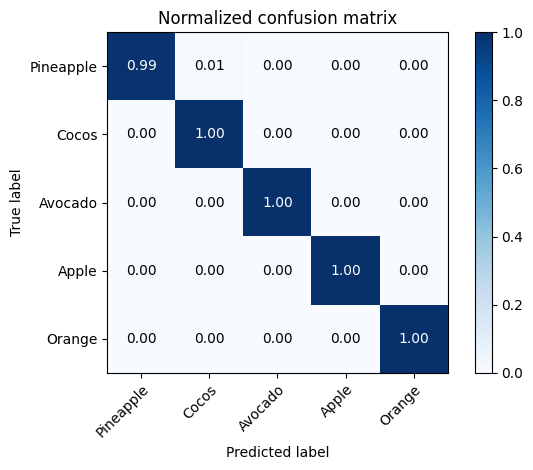

In [46]:
rf_classifier = RandomForestClassifier(n_estimators=10, random_state=70)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)

# Evaluate the performance
accuracy = metrics.accuracy_score(y_test, y_pred) * 100
print("Accuracy with Random Forest: {0:.2f}%".format(accuracy))

# Print classification report
print('\nClassification Report:\n', metrics.classification_report(y_test, y_pred, target_names=fruits))

# Plot confusion matrix
cm, _ = plot_confusion_matrix(y_test, y_pred, classes=y_train, normalize=True, title='Normalized confusion matrix')
plt.show()

## KNN

Accuracy with K-NN: 96.21%


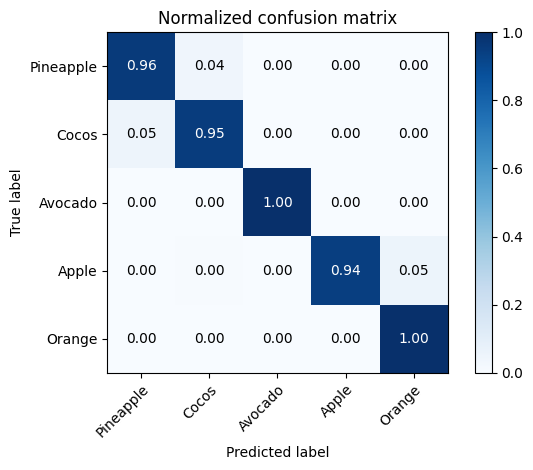

In [66]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
#Evaluation
precision = metrics.accuracy_score(y_pred, y_test) * 100
print("Accuracy with K-NN: {0:.2f}%".format(precision))
cm , _ = plot_confusion_matrix(y_test, y_pred, classes=y_train, normalize=True, title='Normalized confusion matrix')
plt.show()

## HOG Feature Extraction

There are  490   TRAINING  images of  PINEAPPLE
There are  490   TRAINING  images of  COCOS
There are  427   TRAINING  images of  AVOCADO
There are  1413   TRAINING  images of  APPLE
There are  479   TRAINING  images of  ORANGE
There are  166   TEST  images of  PINEAPPLE
There are  166   TEST  images of  COCOS
There are  143   TEST  images of  AVOCADO
There are  472   TEST  images of  APPLE
There are  160   TEST  images of  ORANGE


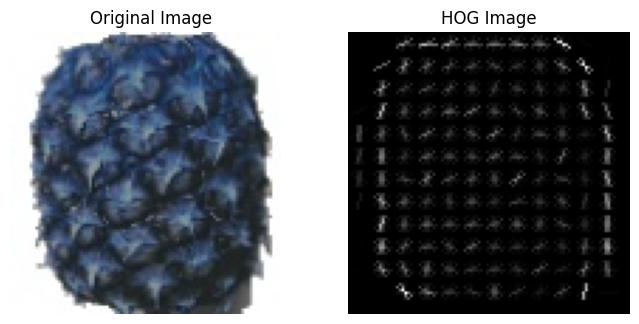

In [19]:
def extract_hog_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    features, hog_image = hog(gray, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=True)
    return features, hog_image

def visualize_hog(image, hog_image):
    # Plot the original image and the HOG image side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

    ax1.axis('off')
    ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')

    ax2.axis('off')
    ax2.imshow(hog_image, cmap=plt.cm.gray)
    ax2.set_title('HOG Image')

    plt.show()

# Get Images and Labels
X_t_hog, y_train_hog = getYourFruits(fruits, 'Training', print_n=True, k_fold=False)
X_test_hog, y_test_hog = getYourFruits(fruits, 'Test', print_n=True, k_fold=False)

# Scale Data Images
scaler = StandardScaler()

# Extract HOG features for training images and visualize the first one
features, hog_image = extract_hog_features(X_t_hog[0])
visualize_hog(X_t_hog[0], hog_image)

# Extract HOG features for training images
X_train_hog = [extract_hog_features(image)[0] for image in X_t_hog]
X_train_hog = scaler.fit_transform(X_train_hog)

# Extract HOG features for testing images
X_test_hog = [extract_hog_features(image)[0] for image in X_test_hog]
X_test_hog = scaler.transform(X_test_hog)

### Linear SVM using HOG

Accuracy with SVM and HOG: 97.47%


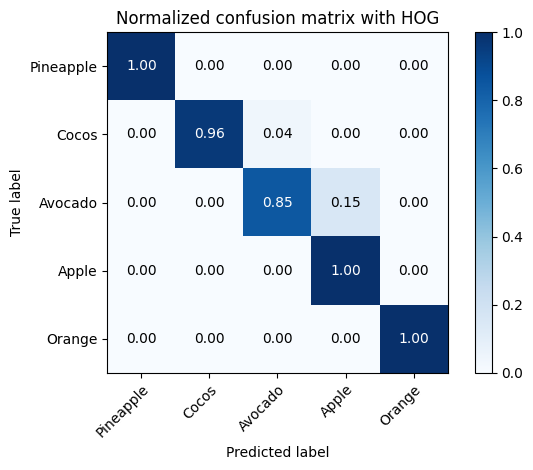

In [21]:
# Train the SVM classifier with HOG features
svm_hog = SVC(gamma='auto', kernel='linear', probability=True)
svm_hog.fit(X_train_hog, y_train_hog)

# Make predictions on the test set with HOG features
y_pred_hog = svm_hog.predict(X_test_hog)

# Evaluate the performance with HOG features
precision_hog = metrics.accuracy_score(y_pred_hog, y_test_hog) * 100
print("Accuracy with SVM and HOG: {0:.2f}%".format(precision_hog))

# Plot confusion matrix
cm_hog, _ = plot_confusion_matrix(y_test_hog, y_pred_hog, classes=y_train_hog, normalize=True, title='Normalized confusion matrix with HOG')
plt.show()